# Ejercicio 01
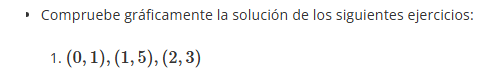

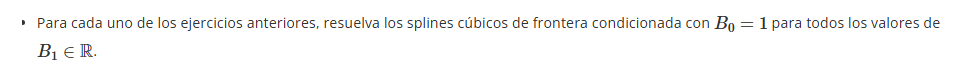

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import math
#l
def clamped_cubic_spline_B1(n, x, a, B0, B1):
    """Calcula los coeficientes del spline cúbico condicionado"""
    # Paso 1: Calcular h_i = x_{i+1} - x_i
    h = [x[i+1] - x[i] for i in range(n)]
    
    # Paso 2: Calcular alpha_0 y alpha_n especiales
    alpha = [0] * (n+1)
    alpha[0] = 3*(a[1] - a[0])/h[0] - 3*B0
    alpha[n] = 3*B1 - 3*(a[n] - a[n-1])/h[n-1]
    
    # Paso 3: Calcular alpha_i para i=1,...,n-1
    for i in range(1, n):
        alpha[i] = (3/h[i])*(a[i+1]-a[i]) - (3/h[i-1])*(a[i]-a[i-1])
    
    # Paso 4: Inicialización
    l = [0] * (n+1)
    mu = [0] * (n+1)
    z = [0] * (n+1)
    
    l[0] = 2*h[0]
    mu[0] = 0.5
    z[0] = alpha[0]/l[0]
    
    # Paso 5: Sustitución hacia adelante
    for i in range(1, n):
        l[i] = 2*(x[i+1] - x[i-1]) - h[i-1]*mu[i-1]
        mu[i] = h[i]/l[i]
        z[i] = (alpha[i] - h[i-1]*z[i-1])/l[i]
    
    # Paso 6: Preparar para sustitución hacia atrás
    l[n] = h[n-1]*(2 - mu[n-1])
    z[n] = (alpha[n] - h[n-1]*z[n-1])/l[n]
    c = [0] * (n+1)
    c[n] = z[n]
    
    # Paso 7: Sustitución hacia atrás
    b = [0] * n
    d = [0] * n
    
    for j in range(n-1, -1, -1):
        c[j] = z[j] - mu[j]*c[j+1]
        b[j] = (a[j+1] - a[j])/h[j] - h[j]*(c[j+1] + 2*c[j])/3
        d[j] = (c[j+1] - c[j])/(3*h[j])
    
    return [(a[j], b[j], c[j], d[j]) for j in range(n)]

def evaluate_spline(x, x_nodes, coefficients):
    """Evalúa el spline en el punto x"""
    for j in range(len(x_nodes)-1):
        if x_nodes[j] <= x <= x_nodes[j+1]:
            a, b, c, d = coefficients[j]
            dx = x - x_nodes[j]
            return a + b*dx + c*dx**2 + d*dx**3
    return 0

# Datos del problema
x_nodes = [0, 1, 2]
y_values = [1, 5, 3]
B0 = 1
B1_values = np.linspace(-10, 10, 100)

# Configuración de la figura
fig, ax = plt.subplots(figsize=(14, 8))
ax.set_xlim(-0.5, 2.5)
ax.set_ylim(-5, 10)
ax.grid(True, alpha=0.3)
ax.set_title('Spline Cúbico Completo: (0,1), (1,5), (2,3)', fontsize=16, pad=20)
ax.set_xlabel('Coordenada x', fontsize=14)
ax.set_ylabel('Valor del Spline', fontsize=14)

# Elementos gráficos
points = ax.plot(x_nodes, y_values, 'ro', markersize=10, zorder=5, label='Puntos de datos')[0]
spline_line, = ax.plot([], [], 'b-', lw=3, label='Curva spline')
tangent_line, = ax.plot([], [], 'g--', lw=2.5, label='Línea tangente')
angle_text = ax.text(2.1, 3, '', fontsize=12, color='darkgreen', weight='bold')
info_text = ax.text(0.02, 0.95, '', transform=ax.transAxes, fontsize=12, 
                   bbox=dict(facecolor='white', alpha=0.9))

# Flecha indicadora
arrow = ax.annotate('', xy=(2, 3), xytext=(2, 3),
                    arrowprops=dict(arrowstyle='->', color='green', lw=2, mutation_scale=15),
                    visible=False)

# Función para calcular el ángulo
def calculate_angle(B1):
    return math.degrees(math.atan(B1))

# Función de inicialización
def init():
    spline_line.set_data([], [])
    tangent_line.set_data([], [])
    info_text.set_text('')
    angle_text.set_text('')
    arrow.set_visible(False)
    return spline_line, tangent_line, info_text, angle_text, arrow

# Función de animación
def animate(i):
    B1 = B1_values[i]
    coefficients = clamped_cubic_spline_B1(len(x_nodes)-1, x_nodes, y_values, B0, B1)
    
    # Actualizar spline
    x_plot = np.linspace(x_nodes[0], x_nodes[-1], 200)
    y_plot = [evaluate_spline(x, x_nodes, coefficients) for x in x_plot]
    spline_line.set_data(x_plot, y_plot)
    
    # Actualizar tangente
    x_tangent = np.linspace(1.7, 2.3, 2)
    y_tangent = y_values[-1] + B1*(x_tangent - x_nodes[-1])
    tangent_line.set_data(x_tangent, y_tangent)
    
    # Actualizar ángulo y elementos visuales
    angle = calculate_angle(B1)
    angle_text.set_text(f'Ángulo: {angle:.1f}°')
    angle_text.set_position((2.1, y_values[-1] + 0.5))
    
    # Controlar visibilidad de la flecha
    if abs(B1) > 0.5:
        arrow.set_visible(True)
        dx = 0.3 if B1 > 0 else -0.3
        dy = B1*dx
        arrow.xy = (2 + dx, y_values[-1] + dy)
        arrow.xyann = (2, y_values[-1])
    else:
        arrow.set_visible(False)
    
    # Actualizar texto informativo
    info_text.set_text(f'Parámetros actuales:\n• Pendiente en x=0: {B0}\n• Pendiente en x=2: {B1:.2f}\n• Ángulo: {angle:.1f}°')
    
    return spline_line, tangent_line, info_text, angle_text, arrow

# Crear animación
ani = FuncAnimation(fig, animate, frames=len(B1_values),
                    init_func=init, blit=True, interval=100)

# Leyenda izquierda - Elementos principales
legend_left = ax.legend(handles=[points, spline_line, tangent_line], 
                       loc='upper left', bbox_to_anchor=(0.01, 0.99),
                       framealpha=0.95, fontsize=12, title="Elementos Gráficos:")
legend_left.get_frame().set_facecolor('white')
legend_left.get_title().set_fontsize(12)

# Leyenda derecha - Información de parámetros
from matplotlib.patches import Patch
info_legend = ax.legend(handles=[
    Patch(facecolor='white', label=f'B0 (fijo) = {B0}'),
    Patch(facecolor='white', label='B1 ∈ [-10, 10]'),
    Patch(facecolor='white', label='Puntos de control:'),
    Patch(facecolor='white', label='(0,1), (1,5)'),
    Patch(facecolor='white', label='(2,3)')
], loc='upper right', bbox_to_anchor=(0.99, 0.99), framealpha=0.95, 
fontsize=11, title="Configuración:", handlelength=0)

info_legend.get_frame().set_facecolor('white')
info_legend.get_title().set_fontsize(12)

# Añadir ambas leyendas al gráfico
ax.add_artist(legend_left)

plt.tight_layout()
plt.close()

HTML(ani.to_jshtml())